In [2]:
import numpy as np
import skfuzzy as fuzz
from skfuzzy import control as ctrl
import csv
import os

Considering the mobile robot dynamics

In [3]:
class MobileRobot:
    def __init__(self, x=0.0, y=0.0, theta=0.0):
        """
        Initializes the mobile robot state.
        :param x: Initial x-position
        :param y: Initial y-position
        :param theta: Initial heading angle (in radians)
        """
        self.x = x
        self.y = y
        self.theta = theta

    def state(self):
        """
        Returns the current state of the robot.
        :return: (x, y, theta)
        """
        return self.x, self.y, self.theta

    def step(self, v, w, dt):
        """
        Updates the robot's state based on control inputs.
        :param v: Linear velocity
        :param w: Angular velocity
        :param dt: Time step
        """
        self.x += np.cos(self.theta) * v * dt
        self.y += np.sin(self.theta) * v * dt
        self.theta += w * dt

    def __repr__(self):
        return f"MobileRobot(x={self.x:.2f}, y={self.y:.2f}, theta={self.theta:.2f})"

After defining the system now move to setting up the fuzzy classification system

In [4]:
# Goal angle and distance inputs
goal_angle = ctrl.Antecedent(np.linspace(-180, 180, 361), 'goal_angle')
goal_distance = ctrl.Antecedent(np.linspace(0, 15, 100), 'goal_distance')

# Fuzzy Inputs
obstacle_angle = ctrl.Antecedent(np.linspace(-180, 180, 361), 'obstacle_angle')
obstacle_distance = ctrl.Antecedent(np.linspace(0, 10, 100), 'obstacle_distance')

# Fuzzy Outputs
angular_velocity = ctrl.Consequent(np.linspace(-4, 4, 100), 'angular_velocity')
linear_velocity = ctrl.Consequent(np.linspace(0, 1, 100), 'linear_velocity')

# Membership functions for angle (degrees)
obstacle_angle['far_left'] = fuzz.trimf(obstacle_angle.universe, [-120, -90, -30])
obstacle_angle['left'] = fuzz.trimf(obstacle_angle.universe, [-70, -60, 0])
obstacle_angle['center'] = fuzz.trimf(obstacle_angle.universe, [-15, 0, 15])
obstacle_angle['right'] = fuzz.trimf(obstacle_angle.universe, [0, 60, 70])
obstacle_angle['far_right'] = fuzz.trimf(obstacle_angle.universe, [30, 90, 120])

# Membership functions for distance
obstacle_distance['near'] = fuzz.trimf(obstacle_distance.universe, [0, 0, 1])
obstacle_distance['medium'] = fuzz.trapmf(obstacle_distance.universe, [0.5, 1.5, 2, 3])
obstacle_distance['far'] = fuzz.trimf(obstacle_distance.universe, [2.5, 4, 15])

# Output: angular velocity (rad/s)
angular_velocity['left'] = fuzz.trimf(angular_velocity.universe, [-2, -1, 0])
angular_velocity['zero'] = fuzz.trimf(angular_velocity.universe, [-0.5, 0, 0.5])
angular_velocity['right'] = fuzz.trimf(angular_velocity.universe, [0, 1, 2])

# Output: linear velocity
linear_velocity['stop'] = fuzz.trimf(linear_velocity.universe, [0, 0, 0])
linear_velocity['slow'] = fuzz.trimf(linear_velocity.universe, [0, 0, 0.5])
linear_velocity['medium'] = fuzz.trimf(linear_velocity.universe, [0.2, 0.5, 0.8])
linear_velocity['fast'] = fuzz.trimf(linear_velocity.universe, [0.5, 1, 1])

# Memberships for goal angle
goal_angle['far_left'] = fuzz.trimf(goal_angle.universe, [-180, -90, -30])
goal_angle['left'] = fuzz.trimf(goal_angle.universe, [-120, -90, 0])
goal_angle['center'] = fuzz.trimf(goal_angle.universe, [-15, 0, 15])
goal_angle['right'] = fuzz.trimf(goal_angle.universe, [0, 90, 120])
goal_angle['far_right'] = fuzz.trimf(goal_angle.universe, [30, 90, 180])

# Memberships for goal distance
goal_distance['reached'] = fuzz.trapmf(goal_distance.universe, [0, 0, 1, 1])
goal_distance['near'] = fuzz.trimf(goal_distance.universe, [0, 0, 3])
goal_distance['medium'] = fuzz.trimf(goal_distance.universe, [2, 5, 10])
goal_distance['far'] = fuzz.trapmf(goal_distance.universe, [8, 15, 50, 50])

# Define fuzzy rules
rules = [
    ctrl.Rule(obstacle_distance['near'] & obstacle_angle['center'], (angular_velocity['left'], linear_velocity['slow'])),
    ctrl.Rule(obstacle_distance['near'] & obstacle_angle['left'], (angular_velocity['right'], linear_velocity['slow'])),
    ctrl.Rule(obstacle_distance['near'] & obstacle_angle['right'], (angular_velocity['left'], linear_velocity['slow'])),

    ctrl.Rule(obstacle_distance['medium'] & obstacle_angle['center'], (angular_velocity['zero'], linear_velocity['medium'])),
    ctrl.Rule(obstacle_distance['medium'] & obstacle_angle['left'], (angular_velocity['right'], linear_velocity['medium'])),
    ctrl.Rule(obstacle_distance['medium'] & obstacle_angle['right'], (angular_velocity['left'], linear_velocity['medium'])),

    ctrl.Rule(obstacle_distance['far'] & obstacle_angle['center'], (angular_velocity['zero'], linear_velocity['fast'])),

    ctrl.Rule(obstacle_angle['far_left'] & goal_angle['right'], (angular_velocity['right'], linear_velocity['medium'])),
    ctrl.Rule(obstacle_angle['far_left'] & goal_angle['left'] & obstacle_distance['medium'], (angular_velocity['left'], linear_velocity['medium'])),
    ctrl.Rule(obstacle_angle['far_left'] & goal_angle['center'] & (goal_distance['medium'] | goal_distance['far']), (angular_velocity['zero'], linear_velocity['medium'])),
    ctrl.Rule(obstacle_angle['far_right'] & goal_angle['center'], (angular_velocity['zero'], linear_velocity['medium'])),
    
    ctrl.Rule(goal_distance['reached'], (angular_velocity['zero'], linear_velocity['stop'])),

    # If no obstacle and goal is far, push hard toward goal angle
    ctrl.Rule(goal_distance['far'] & goal_angle['left'], (angular_velocity['left'], linear_velocity['fast'])),
    ctrl.Rule(goal_distance['far'] & goal_angle['right'], (angular_velocity['right'], linear_velocity['fast'])),
    ctrl.Rule(goal_distance['far'] & goal_angle['center'], (angular_velocity['zero'], linear_velocity['fast'])),

    ctrl.Rule(goal_distance['medium'] & goal_angle['left'], (angular_velocity['left'], linear_velocity['medium'])),
    ctrl.Rule(goal_distance['medium'] & goal_angle['right'], (angular_velocity['right'], linear_velocity['medium'])),
    ctrl.Rule(goal_distance['medium'] & goal_angle['center'], (angular_velocity['zero'], linear_velocity['medium'])),

    # If near the goal, reduce speed and steer gently
    # ctrl.Rule(goal_distance['near'] & goal_angle['left'], (angular_velocity['left'], linear_velocity['medium'])),
    ctrl.Rule(goal_distance['near'] & goal_angle['left'], (angular_velocity['left'], linear_velocity['stop'])),
    ctrl.Rule(goal_distance['near'] & goal_angle['right'], (angular_velocity['right'], linear_velocity['slow'])),
    ctrl.Rule(goal_distance['near'] & goal_angle['center'], (angular_velocity['zero'], linear_velocity['stop'])),

    ctrl.Rule(goal_distance['near'] & goal_angle['far_left'], (angular_velocity['left'], linear_velocity['stop'])),
    ctrl.Rule(goal_distance['near'] & goal_angle['far_right'], (angular_velocity['right'], linear_velocity['stop'])),
]

# Build and simulate fuzzy control system
control_system = ctrl.ControlSystem(rules)
fuzzy_controller = ctrl.ControlSystemSimulation(control_system)

How are controls handled?

In [5]:
def compute_controls(robot, goal, obstacle_center):
    # Robot position and heading
    rob_pos = np.array([robot.x, robot.y])
    heading = robot.theta

    # Vector to obstacle and to goal
    obs_vec = obstacle_center - rob_pos
    goal_vec = np.array(goal) - rob_pos

    distance_to_goal = np.linalg.norm(goal_vec)

    # Get angles to obstacle and goal
    angle_to_obs = np.arctan2(obs_vec[1], obs_vec[0])
    angle_to_goal = np.arctan2(goal_vec[1], goal_vec[0])

    # Angle from robot heading to obstacle [degrees]
    angle_obs_rel = np.rad2deg((angle_to_obs - heading + np.pi) % (2 * np.pi) - np.pi)
    
    # Distance to obstacle
    distance = np.linalg.norm(obs_vec)

    fuzzy_controller = ctrl.ControlSystemSimulation(control_system)
    # Feed into fuzzy controller
    fuzzy_controller.input['obstacle_angle'] = angle_obs_rel
    fuzzy_controller.input['obstacle_distance'] = distance
    fuzzy_controller.input['goal_angle'] = angle_to_goal
    fuzzy_controller.input['goal_distance'] = distance_to_goal
    fuzzy_controller.compute()

    # Extract fuzzy outputs
    v = fuzzy_controller.output['linear_velocity']
    w = fuzzy_controller.output['angular_velocity']

    return v, w

In [6]:
# === Test input states ===
test_cases = [
    {'obs_angle': -90, 'obs_distance': 1.0, 'goal_angle': 0, 'goal_distance': 9.0},
    {'obs_angle': 0, 'obs_distance': 1.0, 'goal_angle': 0, 'goal_distance': 9.0},
    {'obs_angle': 90, 'obs_distance': 1.0, 'goal_angle': 0, 'goal_distance': 9.0},
    {'obs_angle': 0, 'obs_distance': 5.0, 'goal_angle': -10, 'goal_distance': 6.0},
    {'obs_angle': -45, 'obs_distance': 6.5, 'goal_angle': 20, 'goal_distance': 4.5},
    {'obs_angle': 90, 'obs_distance': 3.0, 'goal_angle': -30, 'goal_distance': 2.0},
]

# === Set file path for local Desktop ===
# desktop_path = os.path.join(os.path.expanduser("~"), "Documents\Int_Control\Class_Homework")
filename = "fuzzy_controller_log.csv"

# === Write headers and data ===
with open(filename, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Obstacle Angle (deg)", "Obstacle Distance", "Linear Velocity (v)", "Angular Velocity (w)"])

    for case in test_cases:
        
        fuzzy_controller = ctrl.ControlSystemSimulation(control_system)

        fuzzy_controller.input['obstacle_angle'] = case['obs_angle']
        fuzzy_controller.input['obstacle_distance'] = case['obs_distance']
        fuzzy_controller.input['goal_angle'] = case['goal_angle']
        fuzzy_controller.input['goal_distance'] = case['goal_distance']

        expected_inputs = [ant.label for ant in fuzzy_controller.ctrl.antecedents]
        print("Expected inputs:", expected_inputs)
        print("Current inputs:", fuzzy_controller.input)

        try:
            fuzzy_controller.compute()
        except Exception as e:
            print("❌ Fuzzy controller compute failed!")
            print(str(e))
            v,w = 0.0, 0.0  # fallback outputs
            continue
        # fuzzy_controller.compute()
        print("Outputs available:", fuzzy_controller.output)

        v = fuzzy_controller.output['linear_velocity']
        w = fuzzy_controller.output['angular_velocity']
        writer.writerow([
            case['obs_angle'], case['obs_distance'],
            case['goal_angle'], case['goal_distance'],
            round(v, 4), round(w, 4)
        ])

print(f"✅ Log saved to: {filename}")

Expected inputs: ['obstacle_distance', 'obstacle_angle', 'goal_angle', 'goal_distance']
Current inputs: obstacle_distance : 1.0
obstacle_angle : -90
goal_angle : 0
goal_distance : 9.0

Outputs available: {'angular_velocity': 9.963903167670074e-17, 'linear_velocity': 0.588043533645079}
Expected inputs: ['obstacle_distance', 'obstacle_angle', 'goal_angle', 'goal_distance']
Current inputs: obstacle_distance : 1.0
obstacle_angle : 0
goal_angle : 0
goal_distance : 9.0

Outputs available: {'angular_velocity': -0.04564390118636936, 'linear_velocity': 0.5447643250722148}
Expected inputs: ['obstacle_distance', 'obstacle_angle', 'goal_angle', 'goal_distance']
Current inputs: obstacle_distance : 1.0
obstacle_angle : 90
goal_angle : 0
goal_distance : 9.0

Outputs available: {'angular_velocity': 2.951740414591785e-17, 'linear_velocity': 0.5370851518859114}
Expected inputs: ['obstacle_distance', 'obstacle_angle', 'goal_angle', 'goal_distance']
Current inputs: obstacle_distance : 5.0
obstacle_angle :

Do the calculation

3.9.2
11.1.0
Trajectory: [(0.07084317847222653, 0.0), (0.14148614066268136, 0.00026182191242177667), (0.21192639242101707, 0.0007865540954325311), (0.28216214138542256, 0.0015753023319243068), (0.35219160553197704, 0.0026291905621537133), (0.4220130120263968, 0.003949361661861081), (0.4916241964393844, 0.005536969128095875), (0.5610230063462822, 0.007393182430525971), (0.6302077451866533, 0.009519201499788086), (0.6991767211426636, 0.011916249093045209), (0.7679282457364276, 0.014585571706572735), (0.8364601928038011, 0.01752842163839586), (0.9047707995232802, 0.02074608843757115), (0.972858438265482, 0.024239894236645743), (1.040721478934393, 0.02801118950825518), (1.1083582163916503, 0.03206134989590348), (1.1757668077953527, 0.03639177217317549), (1.2429456671615877, 0.04100390024739028), (1.309893198745921, 0.04589921163196224), (1.3766077948854591, 0.05107921866678612), (1.4430878290531266, 0.056545469387524756), (1.5093317201580339, 0.06229955451942109), (1.5753378750653195, 0.06

Saved as robot_navigation.gif


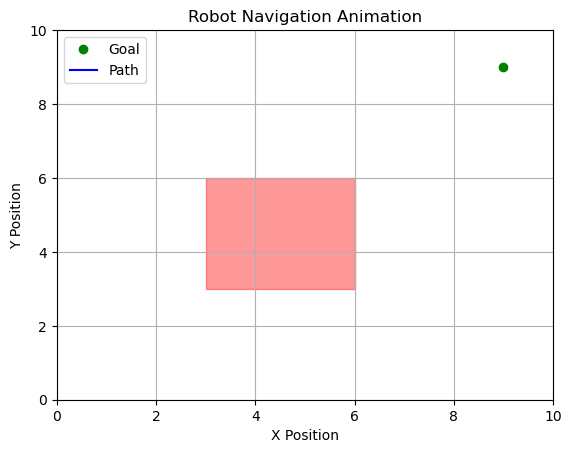

In [7]:
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import PIL
from IPython.display import HTML

print(matplotlib.__version__)
print(PIL.__version__)

# Recreate the path for animation
robot = MobileRobot()
goal = (9, 9)
obstacle_center = np.array([4.5, 4.5])
dt = 0.1
trajectory = []

for _ in range(500):
    v, w = compute_controls(robot, goal, obstacle_center)
    robot.step(v, w, dt)
    trajectory.append((robot.x, robot.y))
    if np.linalg.norm(np.array((robot.x, robot.y)) - goal) < 0.2:
        break

assert len(trajectory) > 0, "Trajectory is empty! Nothing to animate."

# Set up plot
fig, ax = plt.subplots()
ax.set_xlim(0, 10)
ax.set_ylim(0, 10)
ax.set_xlabel("X Position")
ax.set_ylabel("Y Position")
ax.set_title("Robot Navigation Animation")
ax.add_patch(plt.Rectangle((3, 3), 3, 3, color='red', alpha=0.4))
goal_dot, = ax.plot(goal[0], goal[1], 'go', label="Goal")
robot_path, = ax.plot([], [], 'b-', label="Path")
robot_dot, = ax.plot([], [], 'bo')
ax.legend()
plt.grid(True)

# Animation functions
def init():
    robot_path.set_data([], [])
    robot_dot.set_data([], [])
    return robot_path, robot_dot

def animate(i):
    xs = [p[0] for p in trajectory[:i+1]]
    ys = [p[1] for p in trajectory[:i+1]]
    robot_path.set_data(xs, ys)
    # robot_dot.set_data(xs[-1], ys[-1])
    robot_dot.set_data([xs[-1]], [ys[-1]])
    return robot_path, robot_dot

print("Trajectory:", trajectory)
# Create and save animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(trajectory), interval=100)
display(HTML(ani.to_jshtml()))
# ani.save("robot_navigation.gif", writer="pillow", fps=10)
print("Saved as robot_navigation.gif")

In [8]:
ani.save("robot_navigation.gif", writer="pillow", fps=10)

Now I plot the results to view the performance of the system